# Problem Statement :

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

# Dataset Description :

Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

# Importing required libraries

In [1]:
# importing libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

# importing warnings libraries to aviod warnings 

import warnings 
warnings.filterwarnings("ignore")

# calling the dataset

In [2]:
# calling the dataset

df = pd.read_csv("rainfall.csv")
pd.set_option('display.max_columns',None)   #To print all columns
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


here we can see Rain_tommorow  and Rainfall is our target variable..and it is containing categorical values....so it is classification problem.

# EDA 

In [3]:
# checking the shape of dataset 

df.shape

(8425, 23)

In [4]:
# checking the columns name

df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [5]:
# cheking the data types in each columns

df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

here we can see only two types of object is present in columns

In [6]:
# getting information of dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

here we can see there are 16 float values , and 7 object value as present.

In [7]:
# chechking the unique values in dataset

df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

there is not any unique values..

In [8]:
# chechking null values

df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

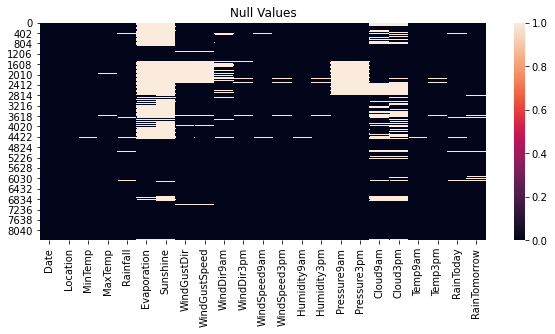

In [9]:
# chechking null values using heatmap

plt.figure(figsize=[10,4])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

here it is claer that about the null values. 

In [10]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.

for i in df.columns:
        print(df[i].value_counts())
        print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=')

2011-03-05    5
2011-02-26    5
2011-01-29    5
2011-03-25    5
2011-01-24    5
             ..
2013-05-03    1
2013-05-12    1
2013-03-18    1
2013-04-24    1
2013-05-04    1
Name: Date, Length: 3004, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 14.8    67
         ..
-1.5      1
 25.9     1
-0.8      1
-1.4      1
-1.1      1
Name: MinTemp, Length: 285, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
44.9     1
10.0     1
43.1     1
40.6     1
10.7     1
Name: MaxTemp, Length: 331, dtype: int6

here we can see there are not any extra entries and unwanted entries are present. i tried to replace zero in Rainfall columns,  but i did not change it because it is target variable..

In [11]:
# replacing the null values.

df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [12]:
#Replacing nan values in columns having skewness
df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].mode()[0])
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].mode()[0])
df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].mode()[0])
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].mode()[0])
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].mode()[0])
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].mode()[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].mode()[0])
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mode()[0])
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mode()[0])
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mode()[0])
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mode()[0])
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mode()[0])
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mode()[0])
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mode()[0])
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mode()[0])
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mode()[0])
df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])
df["RainTomorrow"] = df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0])

In [13]:
# rechecing null values after erase null values

df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

here we can see all the null values has erased.

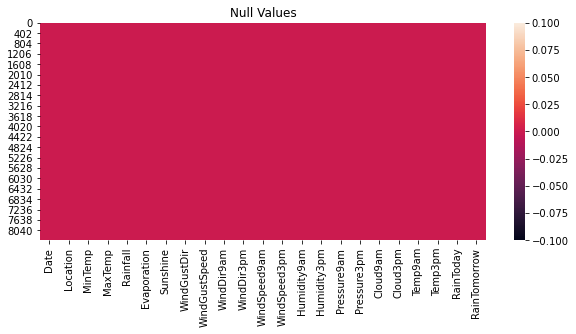

In [14]:
# reVisualizeing null values

plt.figure(figsize=[10,4])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

# Feature Engineering :

In [15]:
df["Date"]=pd.to_datetime(df["Date"])

In [16]:
#Extracting Year, month and date from Date column
df["Year"]=df["Date"].dt.year
df["Month"]=df["Date"].dt.month
df["Day"]=df["Date"].dt.day

In [17]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


after extracting date, now i can drop columns

In [18]:
#Droping Date column

df = df.drop(["Date"],axis=1)

In [19]:
#Shuffeling the dataset

from sklearn.utils import shuffle
df = shuffle(df)
df.reset_index(inplace = True)
df

,index,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,6772,Adelaide,3.7,19.0,0.0,1.4,0.0,N,24.0,N,NNE,0.0,11.0,75.0,32.0,1024.2,1021.1,7.0,7.0,9.6,18.5,No,No,2014,7,22
1,4569,Melbourne,11.3,22.0,16.0,5.6,10.9,SSW,37.0,SW,S,13.0,24.0,51.0,38.0,1024.1,1024.1,4.0,5.0,15.1,20.5,Yes,No,2009,11,23
2,5485,Melbourne,16.4,22.5,27.2,7.0,6.4,N,67.0,N,N,20.0,37.0,89.0,60.0,1006.3,1004.3,6.0,7.0,18.2,20.3,Yes,Yes,2010,3,8
3,5934,Melbourne,6.5,17.6,0.0,1.8,7.4,N,63.0,N,N,28.0,26.0,63.0,47.0,1036.6,1033.0,3.0,7.0,11.4,16.3,No,No,2011,6,30
4,4212,Williamtown,11.3,20.0,4.0,4.0,0.0,WNW,70.0,WNW,WNW,43.0,43.0,45.0,45.0,1010.8,1009.0,7.0,7.0,15.0,18.3,Yes,No,2017,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,3054,Williamtown,12.2,20.5,0.0,6.2,0.0,WNW,61.0,WNW,WNW,35.0,35.0,55.0,37.0,1012.8,1010.7,7.0,7.0,16.1,19.8,No,No,2016,6,8
8421,271,Albury,7.2,17.9,4.2,4.0,0.0,W,59.0,NE,W,20.0,19.0,81.0,80.0,1002.6,996.9,1.0,8.0,13.0,17.5,Yes,Yes,2009,8,29
8422,433,Albury,20.3,33.9,0.0,4.0,0.0,SE,37.0,SE,E,19.0,6.0,53.0,32.0,1020.8,1017.5,7.0,7.0,23.2,32.6,No,No,2010,2,7
8423,5349,Melbourne,12.7,18.8,0.0,5.2,9.8,S,37.0,S,S,17.0,24.0,64.0,44.0,1022.5,1022.2,7.0,1.0,14.2,18.3,No,No,2009,10,23


In [20]:
#lets drop the index column

df.drop(columns = 'index', inplace = True)

In [21]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Adelaide,3.7,19.0,0.0,1.4,0.0,N,24.0,N,NNE,0.0,11.0,75.0,32.0,1024.2,1021.1,7.0,7.0,9.6,18.5,No,No,2014,7,22
1,Melbourne,11.3,22.0,16.0,5.6,10.9,SSW,37.0,SW,S,13.0,24.0,51.0,38.0,1024.1,1024.1,4.0,5.0,15.1,20.5,Yes,No,2009,11,23
2,Melbourne,16.4,22.5,27.2,7.0,6.4,N,67.0,N,N,20.0,37.0,89.0,60.0,1006.3,1004.3,6.0,7.0,18.2,20.3,Yes,Yes,2010,3,8
3,Melbourne,6.5,17.6,0.0,1.8,7.4,N,63.0,N,N,28.0,26.0,63.0,47.0,1036.6,1033.0,3.0,7.0,11.4,16.3,No,No,2011,6,30
4,Williamtown,11.3,20.0,4.0,4.0,0.0,WNW,70.0,WNW,WNW,43.0,43.0,45.0,45.0,1010.8,1009.0,7.0,7.0,15.0,18.3,Yes,No,2017,4,10


In [22]:
#Checking description of data set

df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.182682,23.825365,2.725982,4.810220,4.014042,40.036320,13.803917,18.412582,67.858754,51.295193,1017.198944,1015.635347,5.265875,5.230742,17.742326,22.405982,2012.102433,6.442136,15.741958
std,5.380656,6.128159,10.319872,3.912448,4.744297,13.781296,10.138945,9.763307,16.779787,18.316487,6.359552,6.286580,2.667166,2.564122,5.613463,5.955804,2.473137,3.437994,8.787354
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,2008.000000,1.000000,1.000000
25%,9.300000,19.200000,0.000000,4.000000,0.000000,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,2010.000000,3.000000,8.000000
50%,13.200000,23.200000,0.000000,4.000000,0.200000,39.000000,13.000000,19.000000,68.000000,51.000000,1016.100000,1017.000000,7.000000,7.000000,17.700000,21.800000,2011.000000,6.000000,16.000000
75%,17.300000,28.000000,0.800000,5.200000,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,2014.000000,9.000000,23.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,2017.000000,12.000000,31.000000


# Visualtization:

# Univariate Analysis:

In [23]:
# checking for categorical columns

categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


here we get the list of categorical columns

In [24]:
# checking for categorical columns
Numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        Numerical_columns.append(i)
print(Numerical_columns)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day']


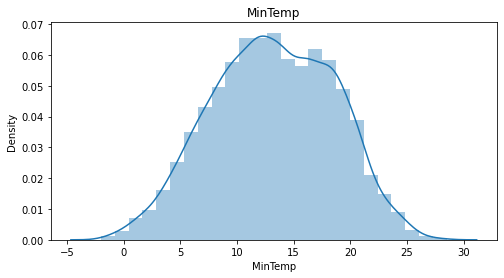

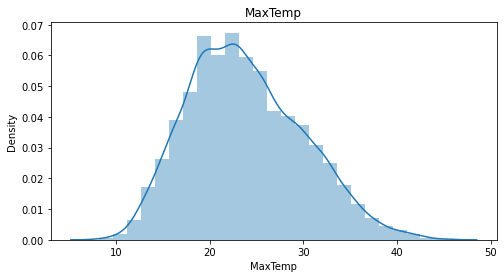

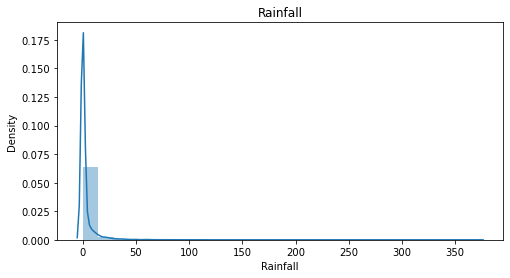

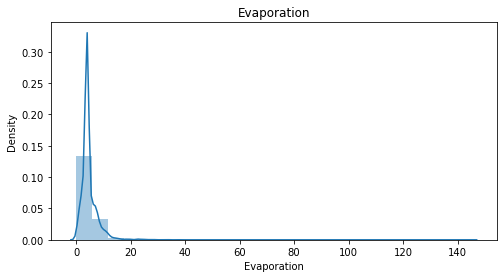

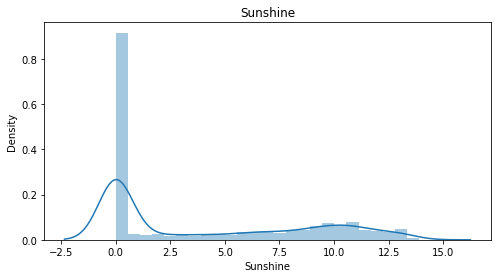

...

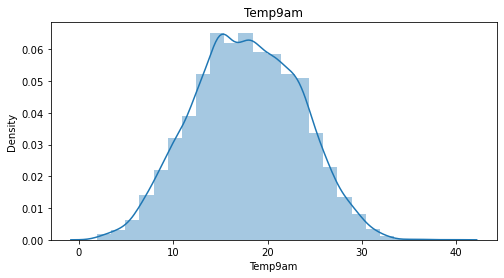

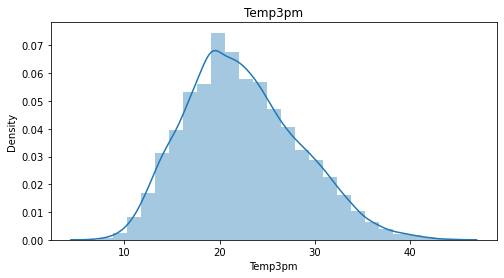

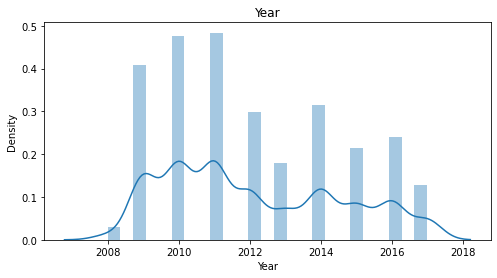

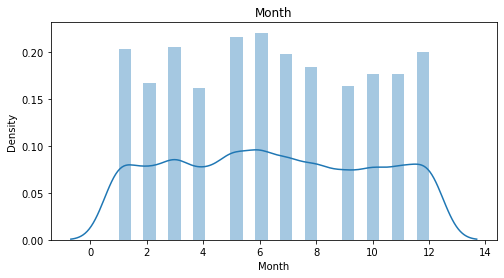

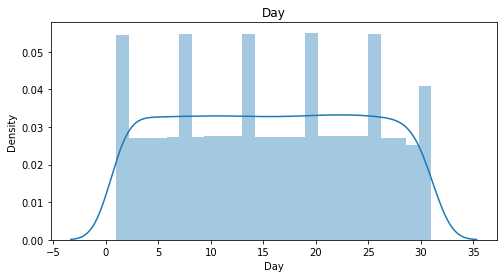

In [25]:
for i in df[Numerical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.distplot(df[i], bins = 25)
    plt.title(i)
    plt.show()

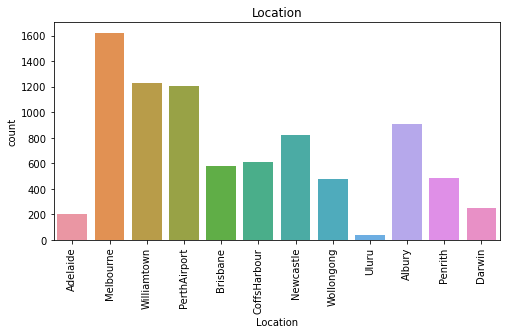

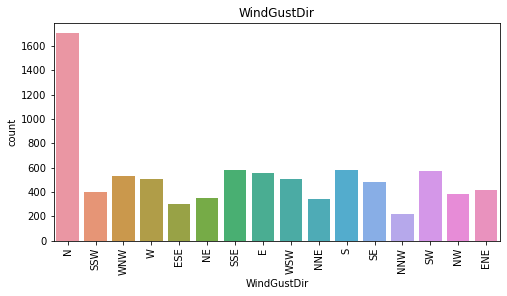

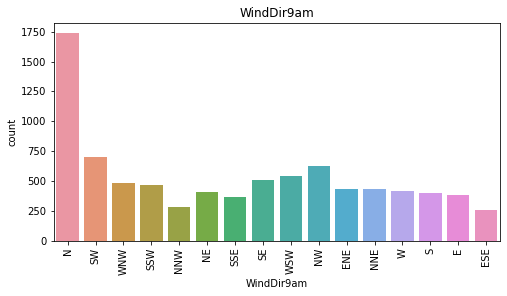

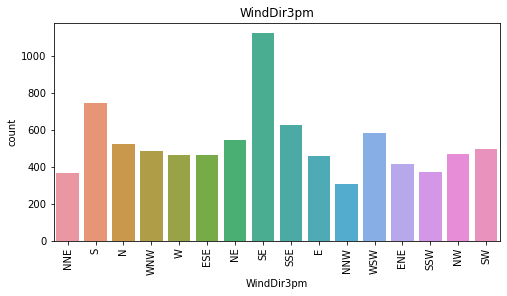

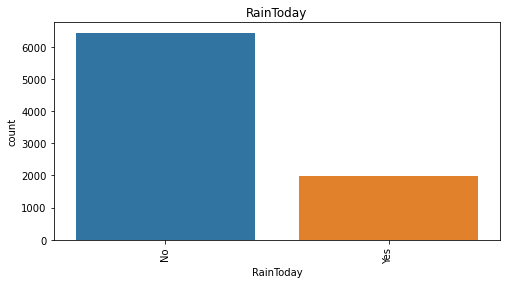

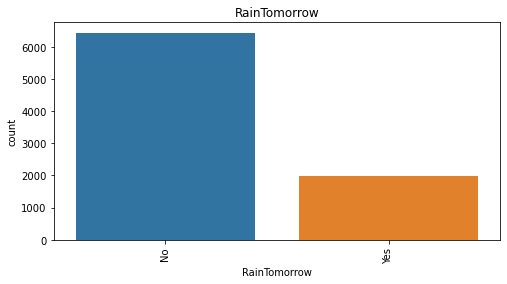

In [26]:
#Distribution plot for all categorical columns

for i in df[categorical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.countplot(df[i])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

i can see in all columns having skewness....we will remove it later

# Bivariate Analysis:

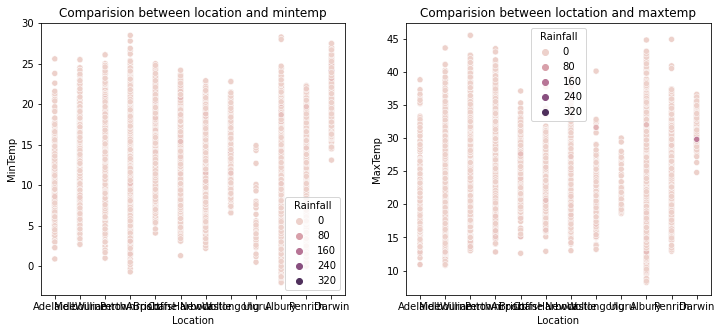

In [27]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between location and mintemp')
sns.scatterplot(df['Location'],df['MinTemp'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between loctation and maxtemp')
sns.scatterplot(df['Location'],df['MaxTemp'],hue=df['Rainfall']);
plt.show()

here we can see 1st plot mintemp is increasing with the Rainfall and 2nd plot is always incresing.

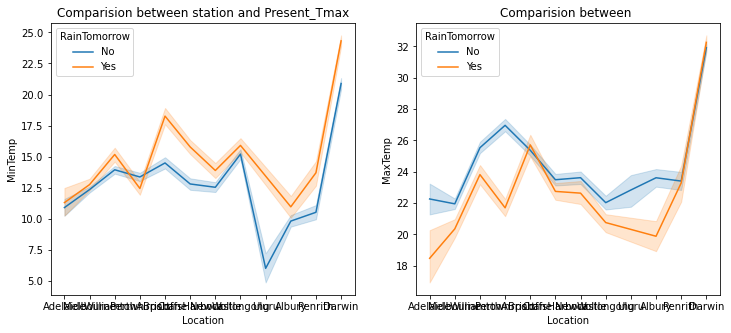

In [28]:
#Comparision between features using line plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between station and Present_Tmax')
sns.lineplot(df['Location'],df['MinTemp'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between ')
sns.lineplot(df['Location'],df['MaxTemp'],hue=df['RainTomorrow']);
plt.show()

here we can see on a speical place in mintemp , there is large chance to rain tommorow. and, on 32 mintempratue there is chance to rain tommorow.

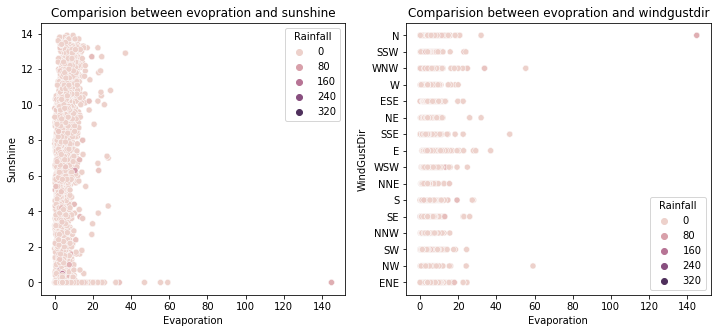

In [29]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between evopration and sunshine')
sns.scatterplot(df['Evaporation'],df['Sunshine'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between evopration and windgustdir')
sns.scatterplot(df['Evaporation'],df['WindGustDir'],hue=df['Rainfall']);
plt.show()

here we can see , mostly sunshine rate between 0-20 of evolution , 20-40 windgustdir rate for evopration 

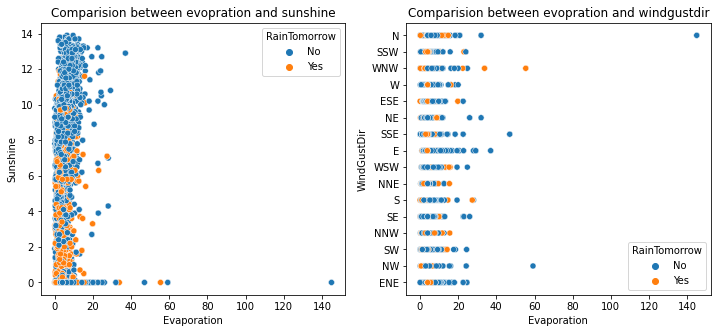

In [30]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between evopration and sunshine')
sns.scatterplot(df['Evaporation'],df['Sunshine'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between evopration and windgustdir')
sns.scatterplot(df['Evaporation'],df['WindGustDir'],hue=df['RainTomorrow']);
plt.show()

here we can see the plotting with the respect of Raintommorow

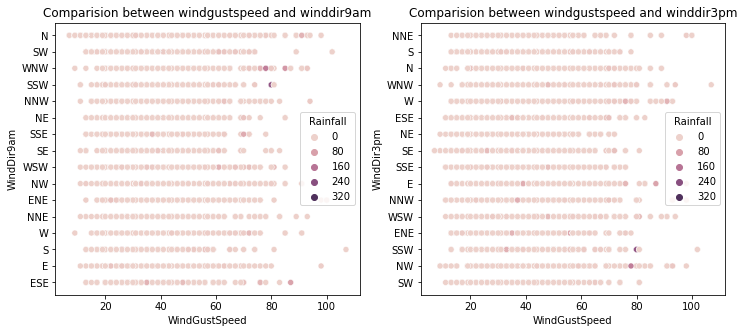

In [31]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between windgustspeed and winddir9am')
sns.scatterplot(df['WindGustSpeed'],df['WindDir9am'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between windgustspeed and winddir3pm')
sns.scatterplot(df['WindGustSpeed'],df['WindDir3pm'],hue=df['Rainfall']);
plt.show()

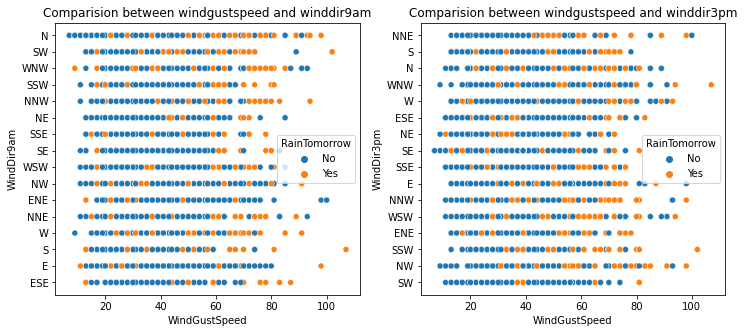

In [32]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between windgustspeed and winddir9am')
sns.scatterplot(df['WindGustSpeed'],df['WindDir9am'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between windgustspeed and winddir3pm')
sns.scatterplot(df['WindGustSpeed'],df['WindDir3pm'],hue=df['RainTomorrow']);
plt.show()

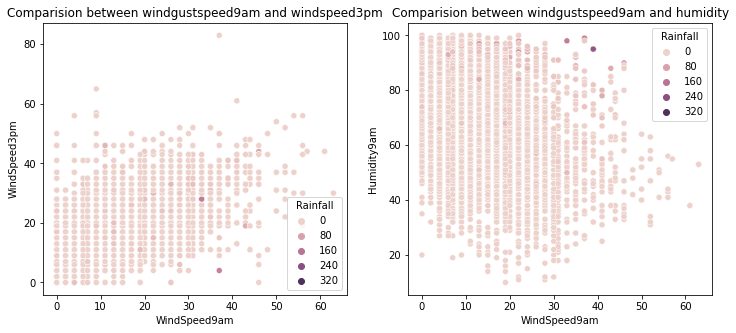

In [33]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between windgustspeed9am and windspeed3pm')
sns.scatterplot(df['WindSpeed9am'],df['WindSpeed3pm'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between windgustspeed9am and humidity')
sns.scatterplot(df['WindSpeed9am'],df['Humidity9am'],hue=df['Rainfall']);
plt.show()

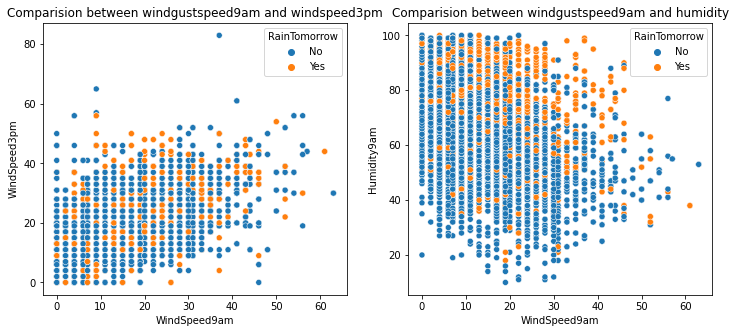

In [34]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between windgustspeed9am and windspeed3pm')
sns.scatterplot(df['WindSpeed9am'],df['WindSpeed3pm'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between windgustspeed9am and humidity')
sns.scatterplot(df['WindSpeed9am'],df['Humidity9am'],hue=df['RainTomorrow']);
plt.show()

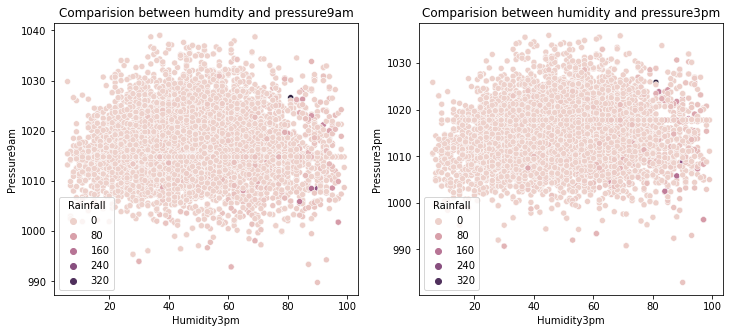

In [35]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between humdity and pressure9am')
sns.scatterplot(df['Humidity3pm'],df['Pressure9am'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between humidity and pressure3pm')
sns.scatterplot(df['Humidity3pm'],df['Pressure3pm'],hue=df['Rainfall']);
plt.show()

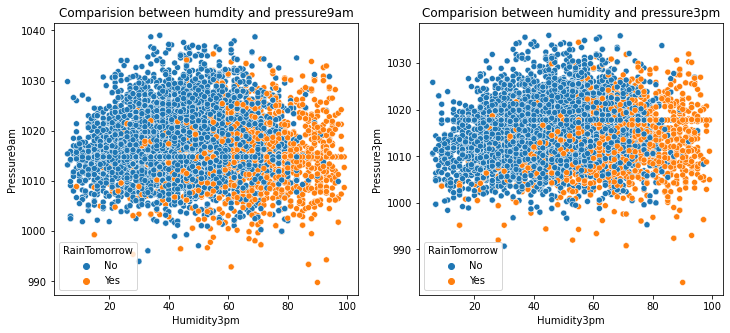

In [36]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between humdity and pressure9am')
sns.scatterplot(df['Humidity3pm'],df['Pressure9am'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between humidity and pressure3pm')
sns.scatterplot(df['Humidity3pm'],df['Pressure3pm'],hue=df['RainTomorrow']);
plt.show()

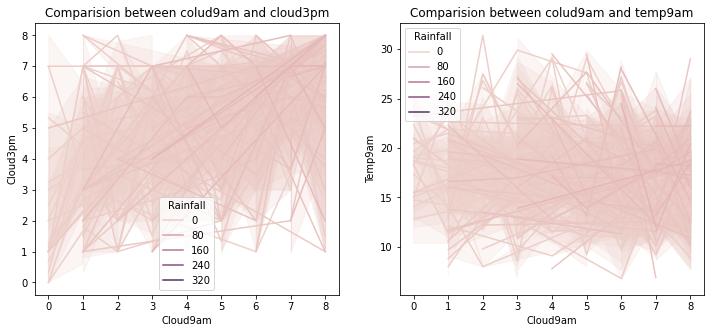

In [37]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between colud9am and cloud3pm')
sns.lineplot(df['Cloud9am'],df['Cloud3pm'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between colud9am and temp9am')
sns.lineplot(df['Cloud9am'],df['Temp9am'],hue=df['Rainfall']);
plt.show()

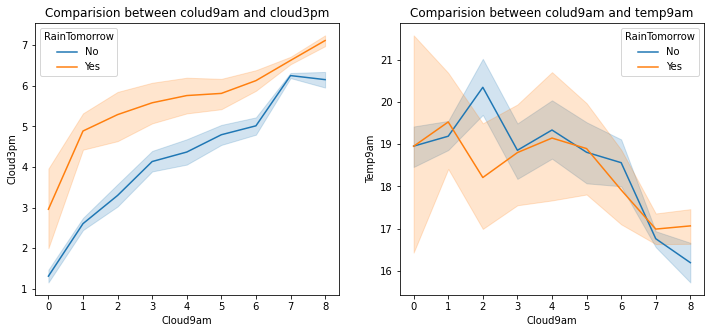

In [38]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between colud9am and cloud3pm')
sns.lineplot(df['Cloud9am'],df['Cloud3pm'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between colud9am and temp9am')
sns.lineplot(df['Cloud9am'],df['Temp9am'],hue=df['RainTomorrow']);
plt.show()

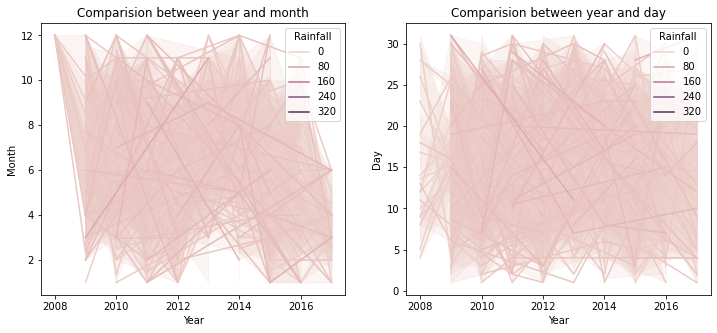

In [39]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between year and month')
sns.lineplot(df['Year'],df['Month'],hue=df['Rainfall']);
plt.subplot(1, 2, 2)
plt.title('Comparision between year and day')
sns.lineplot(df['Year'],df['Day'],hue=df['Rainfall']);
plt.show()

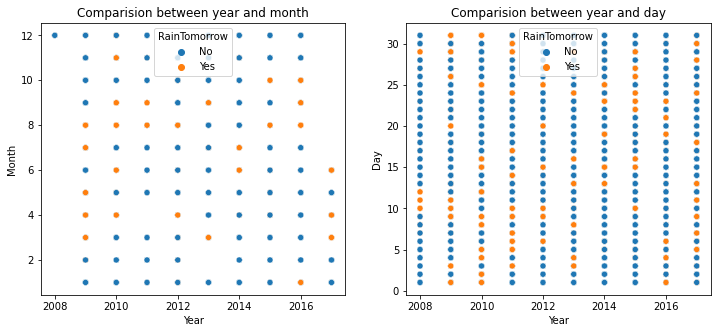

In [40]:
#Comparision between features using scatter plot

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between year and month')
sns.scatterplot(df['Year'],df['Month'],hue=df['RainTomorrow']);
plt.subplot(1, 2, 2)
plt.title('Comparision between year and day')
sns.scatterplot(df['Year'],df['Day'],hue=df['RainTomorrow']);
plt.show()

# Multivariate Analysis:

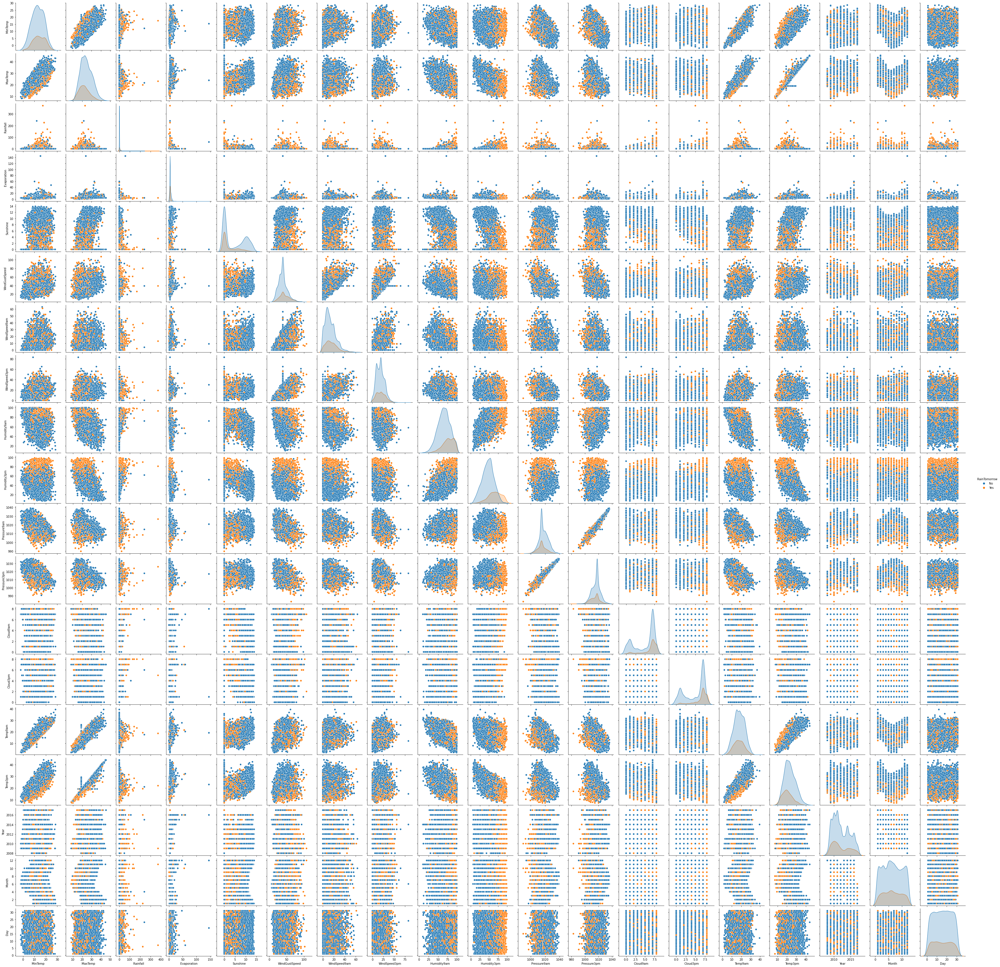

In [41]:
#pair ploting for df

sns.pairplot(df,hue="RainTomorrow")

# Checking For Outliers:

<AxesSubplot:>

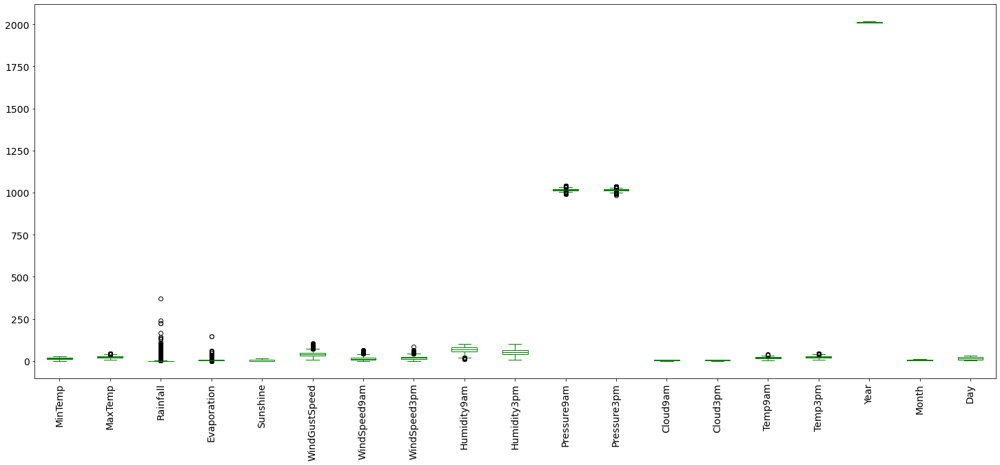

In [42]:
#Checking for outliers

df.plot(rot = 90,kind='box',fontsize=14,figsize=(25,10),color='g')

Here we got outliers in some columns

In [43]:
# using Z score method

#Features having outliers

features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am',
            'Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

In [44]:
from scipy.stats import zscore

z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Adelaide,3.7,19.0,0.0,1.4,0.0,N,24.0,N,NNE,0.0,11.0,75.0,32.0,1024.2,1021.1,7.0,7.0,9.6,18.5,No,No,2014,7,22
1,Melbourne,11.3,22.0,16.0,5.6,10.9,SSW,37.0,SW,S,13.0,24.0,51.0,38.0,1024.1,1024.1,4.0,5.0,15.1,20.5,Yes,No,2009,11,23
2,Melbourne,16.4,22.5,27.2,7.0,6.4,N,67.0,N,N,20.0,37.0,89.0,60.0,1006.3,1004.3,6.0,7.0,18.2,20.3,Yes,Yes,2010,3,8
4,Williamtown,11.3,20.0,4.0,4.0,0.0,WNW,70.0,WNW,WNW,43.0,43.0,45.0,45.0,1010.8,1009.0,7.0,7.0,15.0,18.3,Yes,No,2017,4,10
5,Melbourne,12.0,21.1,0.0,6.8,4.6,SSW,33.0,SW,S,7.0,19.0,71.0,61.0,1026.8,1023.4,7.0,7.0,14.7,18.5,No,No,2009,10,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Williamtown,12.2,20.5,0.0,6.2,0.0,WNW,61.0,WNW,WNW,35.0,35.0,55.0,37.0,1012.8,1010.7,7.0,7.0,16.1,19.8,No,No,2016,6,8
8421,Albury,7.2,17.9,4.2,4.0,0.0,W,59.0,NE,W,20.0,19.0,81.0,80.0,1002.6,996.9,1.0,8.0,13.0,17.5,Yes,Yes,2009,8,29
8422,Albury,20.3,33.9,0.0,4.0,0.0,SE,37.0,SE,E,19.0,6.0,53.0,32.0,1020.8,1017.5,7.0,7.0,23.2,32.6,No,No,2010,2,7
8423,Melbourne,12.7,18.8,0.0,5.2,9.8,S,37.0,S,S,17.0,24.0,64.0,44.0,1022.5,1022.2,7.0,1.0,14.2,18.3,No,No,2009,10,23


In [45]:
#Checking shape of new dataset
df_new.shape

(7986, 25)

In [46]:
df.shape

(8425, 25)

In [47]:
#Checking dataloss in IQR
Dataloss = (((8425-8037)/8425)*100)
Dataloss

4.605341246290801

In [48]:
# Separating categorical columns in df_new

cat_col=[]
for i in df_new.dtypes.index:
    if df_new.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [49]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
df_new[cat_col]= df_new[cat_col].apply(LE.fit_transform)

In [50]:
cor=df_new.corr()

In [51]:
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.116661,0.063374,0.018094,0.092064,-0.098671,-0.037752,0.244937,-0.040598,-0.031205,0.237010,0.228533,0.004012,0.060605,-0.039289,-0.000065,0.037940,0.017126,0.117203,0.059913,0.003097,0.009530,0.480597,-0.086866,-0.005677
MinTemp,0.116661,1.000000,0.717729,0.089233,0.397439,0.147892,-0.153277,0.232463,-0.042955,-0.153982,0.144472,0.189950,-0.127710,0.088943,-0.415328,-0.435792,0.012319,-0.042401,0.888441,0.689531,0.061863,0.091113,0.038847,-0.247304,0.010131
MaxTemp,0.063374,0.717729,1.000000,-0.136731,0.479624,0.298478,-0.231470,0.136882,-0.212715,-0.190317,0.015221,0.097834,-0.383826,-0.410213,-0.324094,-0.414617,-0.242883,-0.244107,0.863498,0.973802,-0.217736,-0.146854,0.116624,-0.162911,0.016650
Rainfall,0.018094,0.089233,-0.136731,1.000000,-0.093872,-0.096979,0.080952,0.088276,0.121505,0.074649,0.051310,0.030628,0.293801,0.288772,-0.098764,-0.037563,0.156734,0.125945,-0.033129,-0.145714,0.697221,0.267936,0.005926,-0.006969,-0.013765
Evaporation,0.092064,0.397439,0.479624,-0.093872,1.000000,0.346983,-0.101453,0.234196,-0.090345,-0.035665,0.231268,0.170949,-0.388976,-0.252728,-0.237692,-0.286299,-0.185313,-0.205064,0.472476,0.462158,-0.164342,-0.090657,0.048525,-0.034369,0.014875
Sunshine,-0.098671,0.147892,0.298478,-0.096979,0.346983,1.000000,-0.046484,0.099062,-0.000853,-0.052358,0.229407,0.198734,-0.393154,-0.316519,0.041095,-0.110472,-0.572775,-0.546645,0.277511,0.295960,-0.135114,-0.195100,-0.272525,0.026603,0.007199
WindGustDir,-0.037752,-0.153277,-0.231470,0.080952,-0.101453,-0.046484,1.000000,0.015747,0.405246,0.508379,0.051100,0.119131,0.028997,0.048538,-0.053995,-0.045459,0.163064,0.127800,-0.181862,-0.243155,0.120785,0.044030,-0.095835,0.038869,0.017399
WindGustSpeed,0.244937,0.232463,0.136882,0.088276,0.234196,0.099062,0.015747,1.000000,-0.064325,0.075521,0.583807,0.630234,-0.266558,-0.087160,-0.351100,-0.347737,-0.018766,0.008988,0.199902,0.102707,0.076975,0.182482,-0.042369,0.043834,-0.004825
WindDir9am,-0.040598,-0.042955,-0.212715,0.121505,-0.090345,-0.000853,0.405246,-0.064325,1.000000,0.244263,0.086414,0.066970,0.006558,0.116334,0.019055,0.056072,0.091271,0.065082,-0.097174,-0.219792,0.148555,0.027015,-0.034052,0.019032,-0.010103
WindDir3pm,-0.031205,-0.153982,-0.190317,0.074649,-0.035665,-0.052358,0.508379,0.075521,0.244263,1.000000,0.039061,0.075636,-0.007714,-0.008455,-0.128473,-0.036071,0.080498,0.055942,-0.171706,-0.203107,0.100307,0.004108,-0.010028,0.028417,-0.000711


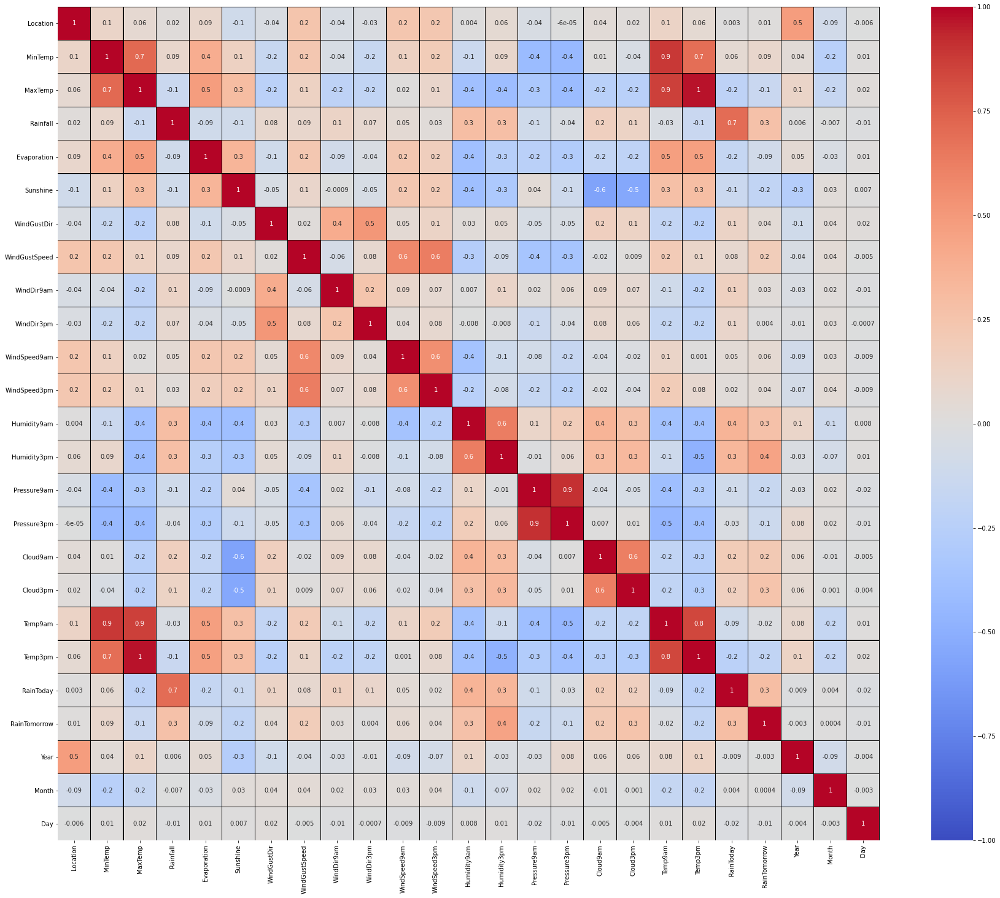

In [52]:
# Visualizing the correlation matrix by plotting heat map.

plt.figure(figsize=(30,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

# Seprating feature and labels

In [66]:
x = df.drop("Rainfall",axis=1)
y = df["Rainfall"]

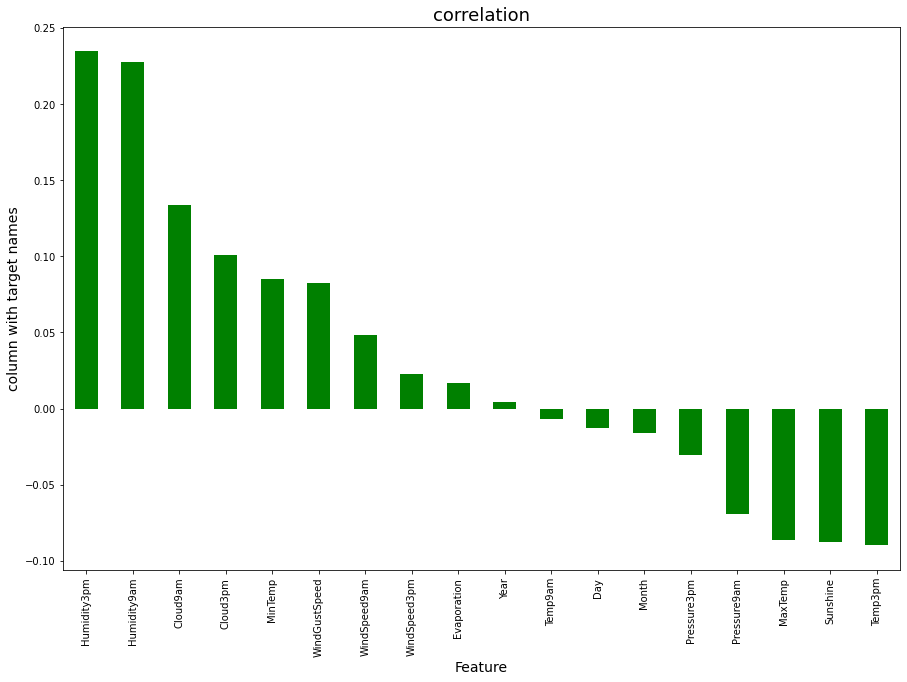

In [67]:
plt.figure(figsize=(15,10))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

# checkling for skewness

In [68]:
df_new.skew()

Location        -0.039959
MinTemp         -0.078160
MaxTemp          0.327128
Rainfall         3.518724
Evaporation      1.507495
Sunshine         0.593800
WindGustDir      0.111581
WindGustSpeed    0.536437
WindDir9am       0.159769
WindDir3pm      -0.125856
WindSpeed9am     0.722205
WindSpeed3pm     0.323679
Humidity9am     -0.237692
Humidity3pm      0.117050
Pressure9am      0.232142
Pressure3pm     -0.138552
Cloud9am        -0.845950
Cloud3pm        -0.783146
Temp9am         -0.028800
Temp3pm          0.350851
RainToday        1.299277
RainTomorrow     1.295883
Year             0.430556
Month            0.054792
Day              0.002232
dtype: float64

In [73]:
skew_fea = ['Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','Cloud9am','Cloud3pm','RainToday','RainTomorrow']

In [74]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [75]:
#Removing skewness using yeo-johnson

x[skew_fea] = scaler.fit_transform(x[skew_fea].values)

ValueError: could not convert string to float: 'No'

In [ ]:
#Checking skewness after removing skewness

x[skew_fea].skew()

i have removed all skewness